In [1]:
from gurobipy import *

from gurobipy import tupledict

import numpy as np
import pandas as pd
import scipy
import timeit
import time
import random
import math
import pdb

from pandas import ExcelWriter

from IPython import display

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def intersection(lst1, lst2):
    return [value for value in lst1 if value in lst2]

In [3]:
def Simulate_biD_static(low_Td=2, max_Td=10, eta_v =0.9, eta_DC_v = 0.9, p=1, Trans_P = 100, low_dl =0.75, high_dl=0.95, S=1, 
                        delta1=1, delta2=0, delta=0.05, NumberOfDays=1, NumberOfVehicles=100, intervalTime=0.25, Optimal=True, 
                        mipGap =2e-2, delta3=1, timelim =300, plan_int = 1, Day_of_Month=15):

    low_Td = low_Td/intervalTime ## convert to delta t
    max_Td = max_Td/intervalTime
    N = NumberOfVehicles*NumberOfDays
    num_interval = int(1/intervalTime)     ### number of intervals in one hour
    T = int(NumberOfDays*24*num_interval)
    Onehour_interval = NumberOfDays*24
    plan_interval = NumberOfDays*24*plan_int

    ##Setting number
    global l

    ## Determine the vehicles in discharge mode vs only charge mode
    np.random.seed(101)
    array= np.arange(1,N+1)
    random.shuffle(array)
    V2G_EV= list(array[:int(len(array)*p)])
    G2V_EV = [i for i in range(1,N+1) if i not in V2G_EV]

    np.random.seed(2)
    df= pd.read_excel('OptimizationEV.xlsx', sheet_name= 'Opt100_2')
    EV_data= df[['EV', 'Ta', 'Td', 'BC', "IS", 'DL', 'pc', 'AR']].iloc[0:100]
    wind_data= df[['Price', 'Time','Time2', 'Wind prod']].iloc[0:96]

    wind_data.set_index('Time2', inplace=True)
    EV_data.set_index('EV', inplace=True)

    ##Arrivals
    trip_df = pd.read_csv('TripStartTime_TripReason.csv')
    trip_df2= trip_df.iloc[31:, :]
    trip_df2.columns = trip_df.iloc[30]
    trip_df2.reset_index(inplace=True)
    trip_df2[['Home', 'Work']] = trip_df2[['Home', 'Work']].astype('int32', inplace=True)

    prob_home= list(trip_df2.iloc[:-1]['Home']/trip_df2.iloc[-1]['Home'])
    prob_work =list(trip_df2.iloc[:-1]['Work']/trip_df2.iloc[-1]['Work'])

    ###### Wind
    df_results = pd.read_csv("results_power.csv")
    np.random.seed(2)

    Apr_wind = df_results[df_results['Time stamp'].str.find('Apr '+ str(Day_of_Month)) != -1]
    May_wind = df_results[df_results['Time stamp'].str.find('May '+ str(Day_of_Month)) != -1]
    Jun_wind = df_results[df_results['Time stamp'].str.find('Jun '+ str(Day_of_Month)) != -1]
    Jul_wind = df_results[df_results['Time stamp'].str.find('Jul '+ str(Day_of_Month)) != -1]
    Aug_wind = df_results[df_results['Time stamp'].str.find('Aug '+ str(Day_of_Month)) != -1]

    Oct_wind = df_results[df_results['Time stamp'].str.find('Oct '+ str(Day_of_Month)) != -1]
    Dec_wind = df_results[df_results['Time stamp'].str.find('Dec '+ str(Day_of_Month)) != -1]
    Jan_wind = df_results[df_results['Time stamp'].str.find('Jan '+ str(Day_of_Month)) != -1]
    Feb_wind = df_results[df_results['Time stamp'].str.find('Feb '+ str(Day_of_Month)) != -1]
    Nov_wind = df_results[df_results['Time stamp'].str.find('Nov '+ str(Day_of_Month)) != -1]

    if NumberOfDays>1:
        for i in range(1,NumberOfDays):
            Apr_wind = Apr_wind.append(df_results[df_results['Time stamp'].str.find('Apr ' +str(Day_of_Month+i)) != -1])
            May_wind = May_wind.append(df_results[df_results['Time stamp'].str.find('May ' +str(Day_of_Month+i)) != -1])
            Jun_wind = Jun_wind.append(df_results[df_results['Time stamp'].str.find('Jun ' +str(Day_of_Month+i)) != -1])
            Jul_wind = Jul_wind.append(df_results[df_results['Time stamp'].str.find('Jul ' +str(Day_of_Month+i)) != -1])
            Aug_wind = Aug_wind.append(df_results[df_results['Time stamp'].str.find('Aug ' +str(Day_of_Month+i)) != -1])

            Oct_wind = Oct_wind.append(df_results[df_results['Time stamp'].str.find('Oct ' +str(Day_of_Month+i)) != -1])
            Dec_wind = Dec_wind.append(df_results[df_results['Time stamp'].str.find('Dec ' +str(Day_of_Month+i)) != -1])
            Jan_wind = Jan_wind.append(df_results[df_results['Time stamp'].str.find('Jan ' +str(Day_of_Month+i)) != -1])
            Feb_wind = Feb_wind.append(df_results[df_results['Time stamp'].str.find('Feb ' +str(Day_of_Month+i)) != -1])
            Nov_wind = Nov_wind.append(df_results[df_results['Time stamp'].str.find('Nov ' +str(Day_of_Month+i)) != -1])

    Summer_wind = [Apr_wind, May_wind, Jun_wind, Jul_wind, Aug_wind]
    Winter_wind = [Oct_wind, Dec_wind, Jan_wind, Feb_wind, Nov_wind]

    wind_summer = []
    for month in Summer_wind:
        month= [month.iloc[k//num_interval]['System power generated | (kW)']/num_interval for k in range(T)] 
        month = pd.Series(month, index= range(T))
        wind_summer.append(month)

    wind_winter = []
    for month in Winter_wind:
        month= [month.iloc[k//num_interval]['System power generated | (kW)']/num_interval for k in range(T)] 
        month = pd.Series(month, index= range(T))
        wind_winter.append(month)

    ####### Price data
    ###
    Price_df = pd.DataFrame(np.zeros((Onehour_interval,1)), index = range(Onehour_interval))
    Summer = ['Apr', 'May', 'Jun', 'Jul', 'Aug']
    Winter = ['Oct', 'Nov', 'Dec','Jan', 'Feb']

    for i in Summer:
        name_df = pd.read_csv('LMPdata/' + i+'_LMP.csv')
        name_df = name_df[name_df['XML_DATA_ITEM'] == 'LMP_PRC']
        name_df = name_df.sort_values('INTERVALSTARTTIME_GMT')[['INTERVALSTARTTIME_GMT', 'MW']]
        name_df.reset_index(inplace=True)
        Price_df[i+'LMP'] = name_df.iloc[:Onehour_interval]['MW']

    for i in Winter:
        name_df = pd.read_csv('LMPdata/' + i+'_LMP.csv')
        name_df = name_df[name_df['XML_DATA_ITEM'] == 'LMP_PRC']
        name_df = name_df.sort_values('INTERVALSTARTTIME_GMT')[['INTERVALSTARTTIME_GMT', 'MW']]
        name_df.reset_index(inplace=True)
        Price_df[i+'LMP'] = name_df.iloc[:Onehour_interval]['MW']

    price_summer = []
    for month in Summer:
        price = [max(0.01,Price_df.iloc[k//num_interval][month+'LMP'])/10 for k in range(T)] #wind data for 96 time slots (every 15 minutes)
        price = pd.Series(price, index= range(T))
        price_summer.append(price)

    price_winter = []
    for month in Winter:
        price = [max(0.01,Price_df.iloc[k//num_interval][month+'LMP'])/10 for k in range(T)] #wind data for 96 time slots (every 15 minutes)
        price = pd.Series(price, index= range(T))
        price_winter.append(price)

    ### Degradation params
    alpha= 1e-1
    beta = 5e-2

    total_wind, excedding_consumption, wind_curtailment, degradation_c = [], [], [],[]

    Total_consumption, Charge_cost, runTime = [],[],[]
    Num_variables, Num_Constraints, objective = [],[], []
    charge_load, discharge_load= [],[]
    violation= []
    Revenue, Cost_tot = [],[]

    Month = ''
    #Simulate S times

    m=[]
    dataset=[]

    for k in range(S):

        m.append(Model('Static_Optimal' + str(k)))
        if k<5:
            Month = Summer[k%5]
            w = wind_summer[k%5]
            price = price_summer[k%5]
        else:
            Month = Winter[k%5]
            w = wind_winter[k%5]
            price = price_winter[k%5]

        elements = range(1, NumberOfDays*24+1)
        probabilities = [x/NumberOfDays for x in prob_home]*NumberOfDays
        home_trip_time = np.random.choice(elements, int(N/2), p=probabilities)

        probabilities = [x/NumberOfDays for x in prob_work]*NumberOfDays
        work_trip_time = np.random.choice(elements, int(N/2), p=probabilities)

        if num_interval>1: 
            Ta = list(home_trip_time*num_interval-np.random.randint(1,num_interval,int(N/2)))
            Ta += list(work_trip_time*num_interval-np.random.randint(1,num_interval,int(N/2)))
        else:
            print('Please choose a time interval less than 1 hour')
            exit(0)

        Td = list(Ta + np.random.randint(low_Td,max_Td+1, N))
        Td= map(lambda x: min(x,T), Td)
        Ta= pd.Series(Ta, index=range(1,N+1))
        Td= pd.Series(Td, index=range(1,N+1))

        ## Vehicle charachteristics
        car = np.random.randint(1,101, N)
        BC = EV_data['BC'][list(car)]
        BC.index = range(1,N+1)
        AR = EV_data['AR'][list(car)]
        pc= EV_data['pc'][list(car)]
        AR.index = range(1,N+1)
        pc.index = range(1,N+1)

        chargepow = np.minimum(AR.values, pc.values)
        chargepow= pd.Series(chargepow, index=range(1,N+1))
        eta = pd.Series(eta_v, index=range(1,N+1))
        eta_DC = pd.Series(eta_DC_v, index=range(1,N+1))

        RESERVE= pd.Series(np.ones((T))*0, index=range(T), dtype= 'float')

        Degradation_cost1 = pd.Series(0.0, index= range(1,N+1))
        Degradation_cost2 = pd.Series(0.0, index= range(1,N+1))
        revenue = pd.Series(0.0, index= range(1,N+1))
        FinalState = pd.Series(np.zeros((N)), index = range(1,N+1))

        cons_w = pd.Series(0.0, index= range(1,N+1))
        cons_z = pd.Series(0.0, index= range(1,N+1))
        cons_dc = pd.Series(0.0, index= range(1,N+1))
        cost = pd.Series(0.0, index= range(1,N+1))
        wind_ev = pd.Series(0.0, index= range(1,N+1))
        Number_EV_with = pd.Series(0.0, index= range(1,N+1))
        #generate using uniform :D
        IS = pd.Series(np.zeros((N)),index = range(1,N+1))
        DL = pd.Series(np.zeros((N)), index= range(1,N+1))
        minSOC = pd.Series(np.ones((N))*5, index= range(1,N+1))
        Immediate_chargeP = pd.Series(np.zeros((N)), index= range(1,N+1), dtype='int')

        for i in range(1,N+1):
            IS[i] = np.random.uniform(0.1, (low_dl-0.1)*BC[i])
            DL[i] = np.random.uniform(low_dl*BC[i], high_dl*BC[i])
            if minSOC[i]> IS[i]:
                timetoreachminLev= int(math.ceil((minSOC[i]+0.1-IS[i])*num_interval/(eta[i]*chargepow[i])))
                Immediate_chargeP[i]= min(Td[i]-Ta[i], timetoreachminLev)

        for i in range(1,N+1):
            BC[i] = max(BC[i], chargepow[i]/num_interval+DL[i])
            if Td[i] == T:
                DL[i] = DL[i] * (T-Td[i]) / (max_Td - low_Td)
            
        B = [i for i in range(1,N+1) if IS[i] < minSOC[i]]
        AA = [i for i in range(1,N+1) if IS[i] >= minSOC[i]]

        EE ={}
        for t in range(T):
            EE[t] = [i for i in range(1, N+1) if t in range(Ta[i], Td[i])]

        X = m[k].addVars(((i,t) for i in range(1,N+1) for t in range (Ta[i]-1,Td[i])), ub=1, vtype= GRB.CONTINUOUS, name= 'X')
        XX = m[k].addVars(((i,t) for i in V2G_EV for t in range (Ta[i]-1,Td[i])), ub=1, vtype= GRB.CONTINUOUS, name= 'XX')
        XX_dc = m[k].addVars(((i,t) for i in V2G_EV for t in range (Ta[i]-1,Td[i])), ub=1, vtype= GRB.CONTINUOUS, name= 'XX_dc')
        XX_res = m[k].addVars(((i,t) for i in V2G_EV for t in range (Ta[i]-1,Td[i])), ub=1, vtype= GRB.CONTINUOUS, name= 'XX_res')

        Y = m[k].addVars(((i,t) for i in V2G_EV for t in range (Ta[i], Td[i])), vtype= GRB.BINARY, name= 'Y')
        YY = m[k].addVars(((i,t) for i in V2G_EV for t in range(Ta[i], Td[i])), vtype= GRB.BINARY, name= 'YY')

        z = m[k].addVars((t for t in range(T)), vtype= GRB.CONTINUOUS, lb=0, name= 'z')

        c = m[k].addVars((t for t in range(T)), vtype = GRB.CONTINUOUS, lb= 0, name='Curtail')

        SOC = m[k].addVars(((i,t) for i in range(1,N+1) for t in range(Ta[i],Td[i]+1)), lb= 0 ,vtype= GRB.CONTINUOUS, name= 'SOC')

        m[k].update()

        if Optimal:
            m[k].setObjective((sum(delta1*z[t]*price[t]+  delta*price[t]*c[t]
                                   - delta2*price[t]*sum(XX_res[i,t]*chargepow[i]/num_interval 
                                    for i in intersection(EE[t], V2G_EV)) for t in range(T))
                                   + delta3*
                                   (quicksum(alpha*((eta[i]*chargepow[i]/num_interval)**2)*
                                             (X[i,t] - X[i,t-1])*(X[i,t] -X[i,t-1])
                                         for i in range(1,N+1) for t in range(Ta[i], Td[i]))
                                   + quicksum(beta*((eta[i]*chargepow[i]/num_interval)**2)*
                                              (X[i,t]*X[i,t])
                                         for i in range(1,N+1) for t in range(Ta[i]-1, Td[i]))
                                   + quicksum(alpha*(((chargepow[i]/num_interval)/eta_DC[i])*(XX[i,t] - XX[i,t-1]))*
                                         (((chargepow[i]/num_interval)/eta_DC[i])*(XX[i,t] - XX[i,t-1]))
                                         for i in V2G_EV for t in range(Ta[i], Td[i]))
                                   + quicksum(beta*(((chargepow[i]/num_interval)/eta_DC[i])*XX[i,t])*
                                               (((chargepow[i]/num_interval)/eta_DC[i])*XX[i,t])
                                         for i in V2G_EV for t in range(Ta[i]-1, Td[i]))
                                   )),GRB.MINIMIZE)
        else:
            m[k].setObjective(sum(X[i,t] for i in range(1,N+1) for t in range(Ta[i],Td[i])) ,GRB.MAXIMIZE)

        m[k].update()

        # Total discharge
        m[k].addConstrs(XX[i,t] == XX_dc[i,t] + XX_res[i,t] for i in V2G_EV for t in range(Ta[i], Td[i]))

        # Reserve discharge
        m[k].addConstrs(sum(XX_res[i,t]*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV)) <= RESERVE[t]
                        for t in range(T) if intersection(EE[t], V2G_EV)!=[])

        #Initial State of Battery
        m[k].addConstrs((SOC[i,Ta[i]] == IS[i] for i in range(1,N+1)), name='InitialState')

        # State of Charge
        m[k].addConstrs((SOC[i,t]==SOC[i,t-1] + X[i,t-1]*eta[i]*chargepow[i]/num_interval for i in G2V_EV 
                         for t in range(Ta[i]+1, Td[i]+1)), name= 'StateofCharge')

        # State of Charge
        m[k].addConstrs((SOC[i,t]==SOC[i,t-1] + (X[i,t-1]*eta[i]*chargepow[i] - XX[i,t-1]*chargepow[i]/eta_DC[i])/num_interval for i in V2G_EV 
                         for t in range(Ta[i]+1, Td[i]+1)), name= 'StateofChargeV2G')

        # Excessive Consumption
        m[k].addConstrs(z[t] >= sum(X[i,t]*chargepow[i]/num_interval for i in intersection(EE[t], G2V_EV)) + 
                        sum((X[i,t]- XX_dc[i,t])*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV))-w[t] 
                        for t in range(T))

        # Transmission limit
        if Optimal==True:
            m[k].addConstrs((z[t] <= Trans_P for t in range(T)), name ='transmission')

        #No Charge before
        m[k].addConstrs(X[i,Ta[i]-1]+XX[i,Ta[i]-1] ==0 for i in V2G_EV)
        m[k].addConstrs(X[i,Ta[i]-1] ==0 for i in G2V_EV)

        #BatteryCapacity
        m[k].addConstrs(SOC[i,t] <= BC[i] for i in range(1,N+1) for t in range(Ta[i], Td[i]+1))

        # either Charge or discharge or do nothing
        m[k].addConstrs(X[i,t] <= 2*(1-Y[i,t]) for i in V2G_EV for t in range(Ta[i], Td[i]))
        m[k].addConstrs(XX[i,t] <= 2*(1-YY[i,t]) for i in V2G_EV for t in range(Ta[i], Td[i]))
        m[k].addConstrs(0.99<=Y[i,t]+YY[i,t]<=1.01 for i in V2G_EV for t in range(Ta[i], Td[i]))

        # either dischrage for charging or reserve
        m[k].addConstrs(XX_dc[i,t]+XX_res[i,t] <=1 for i in V2G_EV for t in range(Ta[i], Td[i]))

        # Full Charge when we don't reach the desired level during plugin
        m[k].addConstrs(X[i,t]>=1 for i in range(1,N+1) for t in range(Ta[i], Td[i]) 
                        if IS[i]+eta[i]*chargepow[i]*(Td[i] - Ta[i])/num_interval < DL[i])

        # Final state of charge should be more than desired level
        m[k].addConstrs(SOC[i,Td[i]] >= DL[i] for i in range(1,N+1) if IS[i]+ chargepow[i]*eta[i]*(Td[i] - Ta[i])/num_interval >= DL[i])

        # Min level of Charge
        m[k].addConstrs((SOC[i,t] >= minSOC[i]+0.1 for i in AA for t in range(Ta[i]+1, Td[i]+1))
                        , name= 'MinStateofCharge')

        # Min level of Charge2
        m[k].addConstrs((X[i,t]>=1 for i in B for t in range(Ta[i], Ta[i]+Immediate_chargeP[i]))
                        , name= 'MinStateofCharge2')
        
        m[k].addConstrs((SOC[i,t] >= minSOC[i]-0.1 for i in B for t in range(Ta[i]+Immediate_chargeP[i], Td[i]+1)
                        if Ta[i]+Immediate_chargeP[i] != Td[i]), name= 'MinStateofCharge3')

        #curtailment
        m[k].addConstrs(c[t] >= w[t] + sum(XX_dc[i,t]*chargepow[i]/num_interval for i in intersection(V2G_EV, EE[t])) 
                            - sum(X[i,t]*chargepow[i]/num_interval for i in EE[t]) for t in range(T))

        #Non-Optimal
        if Optimal == False:
            m[k].addConstrs(X[i,Ta[i]]==1 for i in range(1,N+1))

        m[k].update()
        print('\n\n\nScenario {} NumVar and NumConstr = {}, {}'.format(k, m[k].NumVars, m[k].NumConstrs))

        m[k].params.MIPGap = mipGap
        m[k].params.TimeLimit = timelim
        m[k].params.OutputFlag = 0
        m[k].optimize()

        obj = m[k].getObjective()
        v = m[k].getVars()

        if m[k].status == GRB.Status.OPTIMAL:
            print('Optimal objective: %g' % m[k].objVal)
        elif m[k].status == GRB.Status.INFEASIBLE:
            print('Model is infeasible')
            #exit(0)
        elif m[k].status == GRB.Status.UNBOUNDED:
            print('Model is unbounded')
            #exit(0)
        else:
            print('Optimization ended with status %d' % m[k].status)
            #exit(0)

        status = m[k].status
#             try:
#     #             print([X[j-1][371,t].x for t in range(j*4, Td[371])])
#                 print('IS: ', IS[204])
#                 print('DL: ',  DL[204])
#                 print(Td[204], Ta[204])
#             except:
#                 pass
        #Loop until we reduce to a model that can be solved
        if status == GRB.Status.INFEASIBLE:
            m[k].computeIIS()
            print('\nThe following constraint cannot be satisfied:')
            for c in m[k].getConstrs():
                if c.IISConstr:
                    print('%s' % c.constrName)
            print('')

        for i in range(1,N+1):
            wind_ev[i] = sum(w[t] for t in range(Ta[i], Td[i]))
            EEEE = set(sum([EE[t] for t in range(Ta[i], Td[i])],[]))
            Number_EV_with[i] = len(EEEE)

        rev=0
        ## lets model the consumption for each EV:
        for t in range(T):
            avail_w =  w[t]
            avail_DC = sum(XX_dc[i,t].x*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV))
            EVV = [(i,SOC[i,Td[i]].x - SOC[i,t].x) for i in EE[t] if X[i,t].x>0]
            EVV.sort(key=lambda x: x[1], reverse = True)
            if len(EVV)==0:
                continue
            for (ev, _) in EVV:
                if avail_DC >= X[ev,t].x*chargepow[ev]/num_interval:
                    avail_DC -= X[ev,t].x*chargepow[ev]/num_interval
                    cons_dc[ev] += X[ev,t].x*chargepow[ev]/num_interval
                    cost[ev] += 0.9*price[t]*(X[ev,t].x*chargepow[ev]/num_interval)
                    rev+= 0.9*price[t]*(X[ev,t].x*chargepow[ev]/num_interval)
                elif avail_DC< X[ev,t].x*chargepow[ev]/num_interval:
                    cons_dc[ev] += avail_DC
                    charge_required = X[ev,t].x*chargepow[ev]/num_interval-avail_DC
                    cost[ev] += 0.9*price[t]*avail_DC
                    rev+= 0.9*price[t]*avail_DC
                    avail_DC = 0
                    if avail_w >= charge_required:
                        avail_w -= charge_required
                        cons_w[ev] += charge_required
                    elif avail_w < charge_required:
                        cons_w[ev] += avail_w
                        cons_z[ev] += charge_required - avail_w
                        cost[ev] += price[t]*(charge_required - avail_w)
                        avail_w = 0


        for i in V2G_EV:
            FinalState[i]= SOC[i,Td[i]].x
            revenue[i] += sum(price[t]* XX_res[i,t].x*chargepow[i]/num_interval for t in range(Ta[i], Td[i]))
            revenue[i] += sum(0.9*price[t]*XX_dc[i,t].x*chargepow[i]/num_interval for t in range(Ta[i], Td[i]))
            Degradation_cost1[i] = sum(alpha*((eta[i]*chargepow[i]/num_interval)**2)*((X[i,t].x - X[i,t-1].x)**2) for t in range(Ta[i], Td[i]))
            Degradation_cost1[i] += sum(alpha*(((chargepow[i]/num_interval)/eta_DC[i])**2)*((XX[i,t].x - XX[i,t-1].x)**2) for t in range(Ta[i], Td[i]))
            Degradation_cost2[i] = sum(beta*(((eta[i]*chargepow[i]/num_interval)**2)*(X[i,t].x**2) + 
                                             (((chargepow[i]/num_interval)/eta_DC[i])**2)*(XX[i,t].x**2)) for t in range(Ta[i]-1, Td[i]))    
        for i in G2V_EV:
            FinalState[i]= SOC[i,Td[i]].x
            Degradation_cost1[i] = sum(alpha*((eta[i]*chargepow[i]/num_interval)**2)*((X[i,t].x - X[i,t-1].x)**2) for t in range(Ta[i], Td[i]))
            Degradation_cost2[i] = sum(beta*((eta[i]*chargepow[i]/num_interval)**2)*(X[i,t].x**2) for t in range(Ta[i]-1, Td[i]))

#         print('ConsDC', sum(XX_dc[i,t].x*chargepow[i]/num_interval for i in V2G_EV for t in range(Ta[i], Td[i])))
#         print('ConsDC', cons_dc.sum())
#         print('RES_DC', sum(XX_res[i,t].x*chargepow[i]/num_interval for i in V2G_EV for t in range(Ta[i], Td[i])))

        n_violated=0
        for i in range(1,N+1):
            if FinalState[i]<DL[i]-0.01:
                n_violated+=1

        total_cost = pd.Series(cost+Degradation_cost1+Degradation_cost2-revenue, index=range(1,N+1))

        violation.append(n_violated)

        C = []
        for t in range(T):
            C.append(z[t].x)
        C= pd.Series(C)

        Curtailment = []
        for t in range(T):
            Curtailment.append(c[t].x)

        Curtailment = pd.Series(Curtailment)

        Consumption = sum(X[i,t].x*chargepow[i]/num_interval for i in range(1,N+1) for t in range(Ta[i]-1,Td[i]))
        charging_load = pd.Series([sum(X[i,t].x*chargepow[i]/num_interval for i in EE[t]) for t in range(T)], index= range(T))
        discharging_load = pd.Series([sum(XX[i,t].x*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV)) for t in range(T)], index= range(T))
        discharging_DC_load = pd.Series([sum(XX_dc[i,t].x*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV)) for t in range(T)], index= range(T))
        discharging__RES_load = pd.Series([sum(XX_res[i,t].x*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EV)) for t in range(T)], index= range(T))


        plt.figure(figsize=(14,8))
        plt.plot(range(T), charging_load, label= 'Charging load')
        plt.plot(range(T), w, label= 'Wind energy generated')
        plt.plot(range(T), discharging_load, label= 'Discharging load')
        plt.legend(loc='best')
        plt.xticks(np.arange(0,T+1,16), labels=[int(x/num_interval) for x in list(np.arange(0,96,16))*NumberOfDays])
        plt.xlabel('Time of the day',fontsize= 15)
        plt.ylabel('Energy in kWh', fontsize= 15)

        charging_cost = sum(z[t].x*price[t] for t in range(T))

        degradation_c.append(sum(Degradation_cost1+Degradation_cost2))
        excedding_consumption.append(C.sum())
        wind_curtailment.append(sum(Curtailment))  
        Total_consumption.append(Consumption)
        Charge_cost.append(cost.sum())
        Cost_tot.append(total_cost.sum())
        runTime.append(m[k].Runtime)
        Num_variables.append(m[k].NumVars)
        Num_Constraints.append(m[k].NumConstrs)
        objective.append(m[k].objVal)
        total_wind.append(w.sum())
        charge_load.append(charging_load.sum())
        discharge_load.append(discharging_load.sum())
        Revenue.append(revenue.sum())

        dummy_df= pd.DataFrame(data=[BC, AR, pc, chargepow, IS, DL, Ta, Td, FinalState, Degradation_cost1, Degradation_cost2], 
                               index=['BC', 'AR', 'pc','chargepow', 'IS', 'DL', 'Ta', 'Td','FinalState','DegCost1','DegCost2']).transpose()
        dummy_df['wind']=pd.Series(w.sum(), index= range(1,N+1))
        dummy_df['Charge load kWh'] =pd.Series([sum(X[i,t].x*chargepow[i]/num_interval for t in range(Ta[i]-1,Td[i])) for i in range(1,N+1)],
                                           index= range(1,N+1))
        dummy_df['ChargeCost'] =pd.Series([cost[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['WindUsage'] = pd.Series([cons_w[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['TotalDischarge kWh'] = pd.Series([sum(XX[i,t].x*chargepow[i]/num_interval for t in range(Ta[i], Td[i])) 
                                                for i in V2G_EV], index= V2G_EV)
        dummy_df['wind during park'] = pd.Series([wind_ev[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Revenue'] = pd.Series([revenue[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Is in V2G'] = pd.Series([(i in V2G_EV) for i in range(1,N+1)], index= range(1,N+1))
        dataset.append(dummy_df)

    EV_dataset = pd.concat(dataset, axis=0)
    EV_dataset.reset_index(inplace=True)
    if l ==1:
        with ExcelWriter('EV_Dataset_sell_continous.xlsx') as writer:
            EV_dataset.to_excel(writer, sheet_name='setting {}'.format(l))
    else: 
        with ExcelWriter('EV_Dataset_sell_continous.xlsx',engine="openpyxl", mode='a') as writer:
            EV_dataset.to_excel(writer, sheet_name='setting {}'.format(l))

    Scenario_setting = (low_Td, max_Td, S, delta, NumberOfDays, N, Optimal)
    print('Simulation Parameters are: \n')
    print('min parking time {}\nmax parking time {}\nnumber of Scenarios {}\n'.format(low_Td, max_Td, S))
    print('Delta {}\nNumber of Days {}\nNumber of Vehicles {}\nOptimality {}\nMin desired level {}\nMax desired level {}'.format
          (delta, NumberOfDays, N, Optimal, low_dl, high_dl))
    print('Delta1 {}\nDelta2 {}\nDelta3 {}\neta_c {}\neta_dc {}\nTrans_P {}\nProb of V2G is {}\nOptimality is {}'.format
          (delta1,delta2,delta3, eta_v, eta_DC_v, Trans_P, p, Optimal))
    print('\nResponses are: \n')
    print('Total wind: ', total_wind)
    print('degradation cost: ', degradation_c)
    print('exceeding consumption: ', excedding_consumption)
    print('Wind curtailment: ', wind_curtailment)
    print('Total revenue: ', Revenue)
    print('load charge: ', charge_load)
    print('total consumption: ', Total_consumption)
    print('total Charge load: ', charge_load)
    print('total discharge: ', discharge_load)
    print('total charging cost: ', Charge_cost)
    print('total cost (charge cost + deg cost - revenue): ', Cost_tot)
    print('Charge cost per kWh is: ', [x/y for x,y in zip(Charge_cost, Total_consumption)])
    print('Run Time is: ', runTime)
    print('Total number of variables: ', Num_variables)
    print('Total number of Constraints: ', Num_Constraints)
    print('Total number of Violations: ', violation)
    print('objective is: ', objective)

#### Performance evaluation for objective function hyperparameters

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


Academic license - for non-commercial use only



Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14664.4



Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 10429



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 11015.7



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min:

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 18831.4



Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14271.4



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 17647.5



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed va

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 22233.3


C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)





Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 17333.6



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 22945.4



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 54040.4



Scenario 4 NumVar and NumConstr = 225803, 258746
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed va

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 25453


C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)





Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 20162.2



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 27774.9



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 55379.8



Scenario 4 NumVar and NumConstr = 225803, 258746
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed va

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 28616.3


C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)





Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 22879.5



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 32393.5



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 56711.9



Scenario 4 NumVar and NumConstr = 225803, 258746
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed va

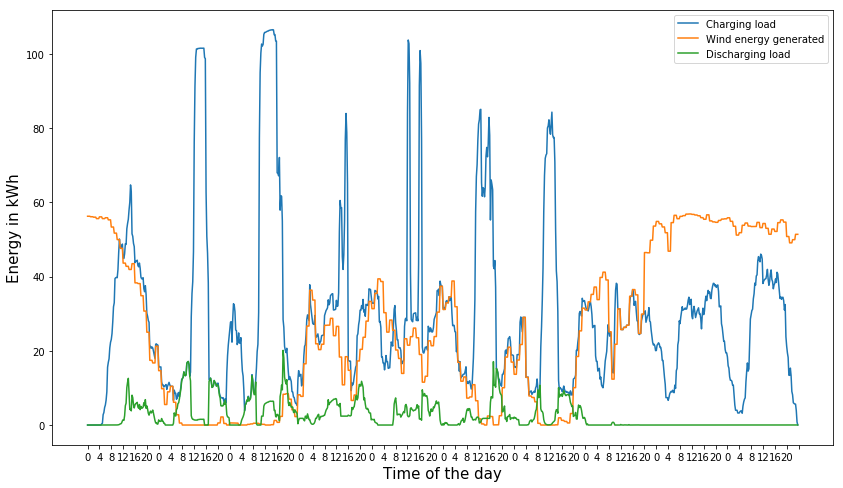

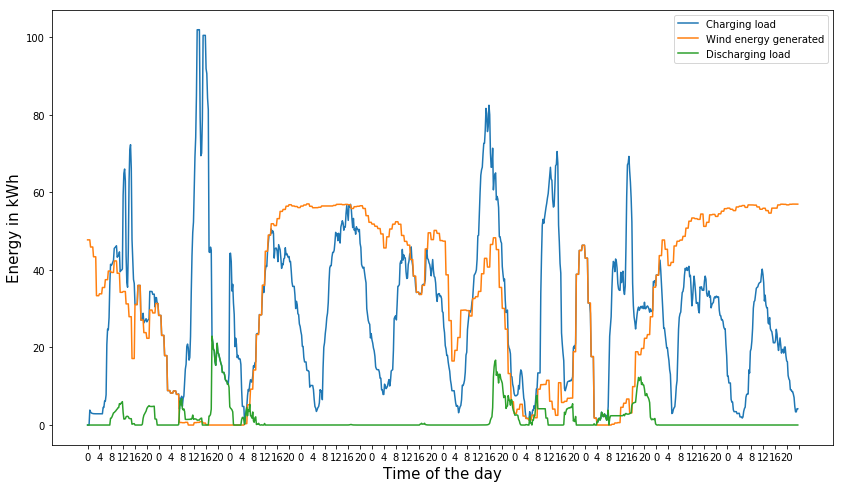

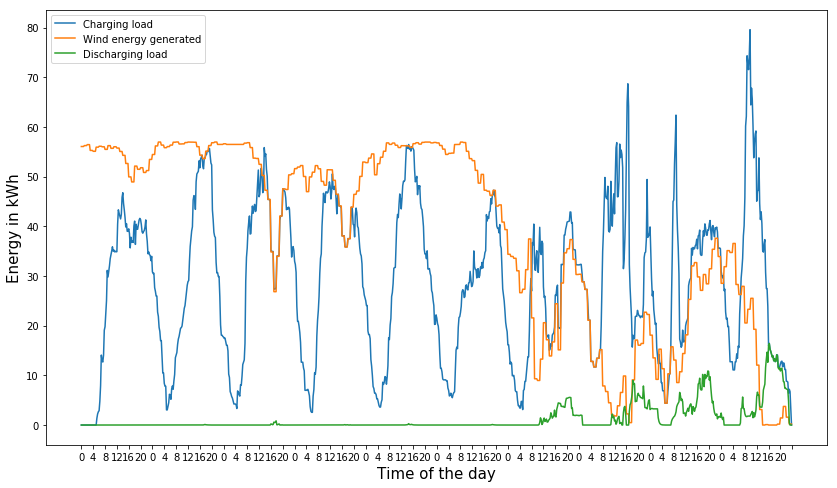

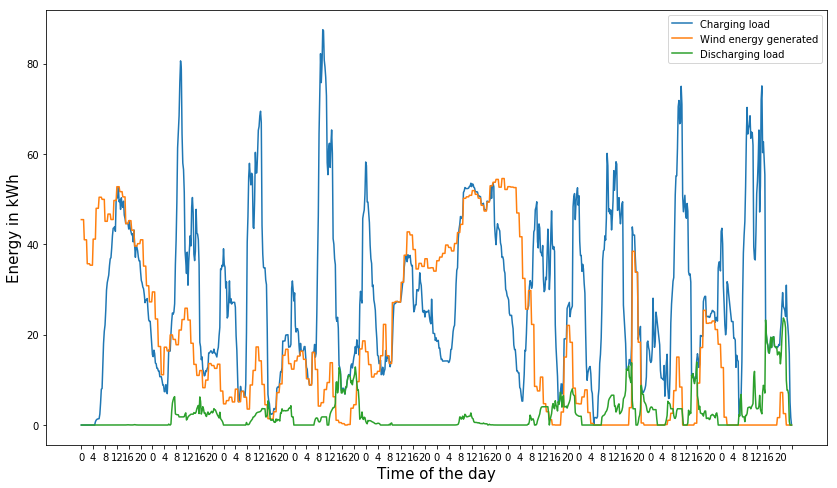

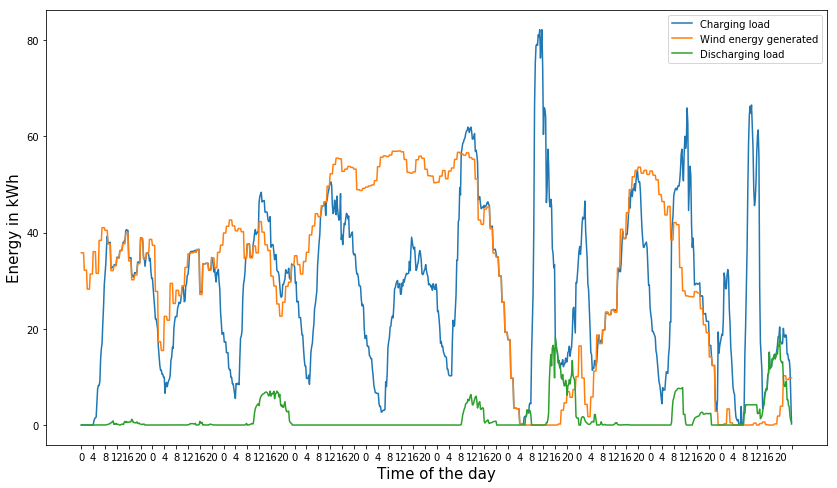

...

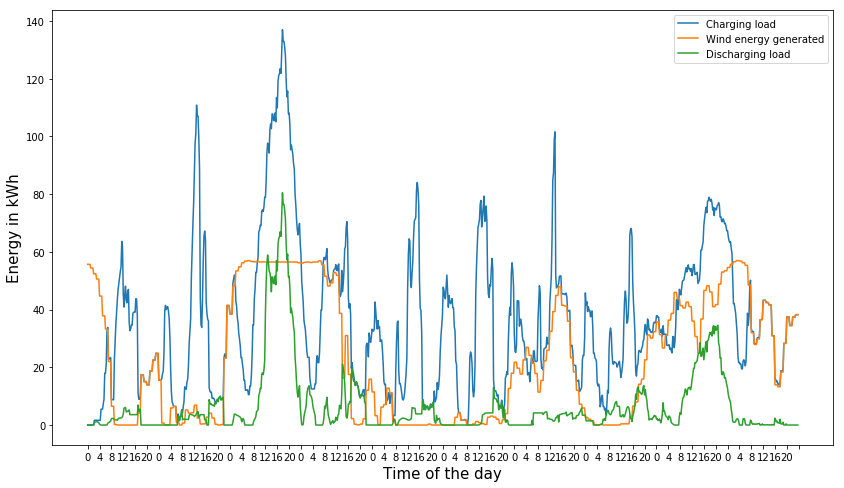

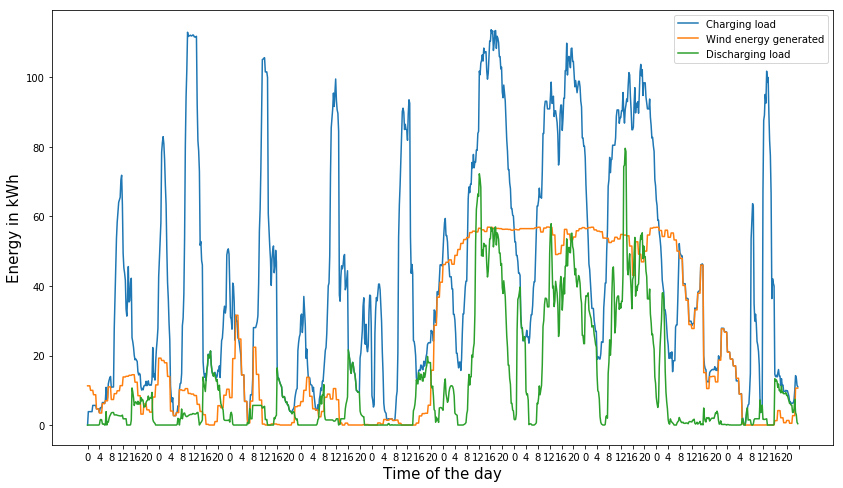

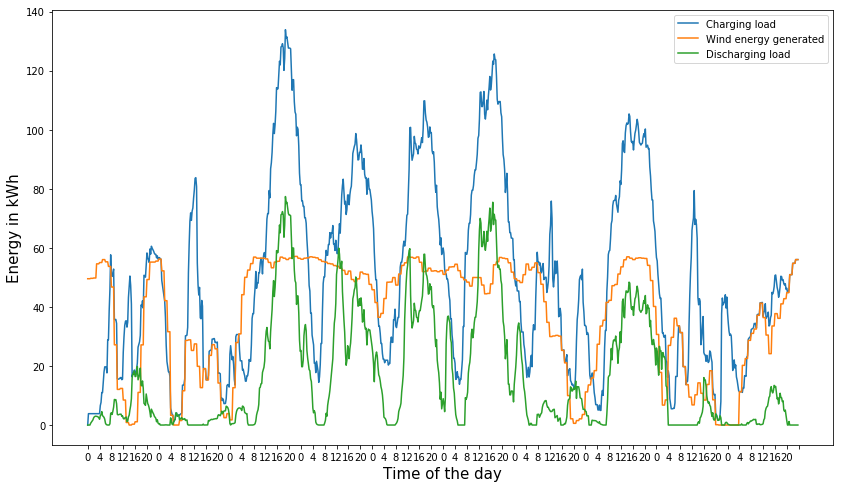

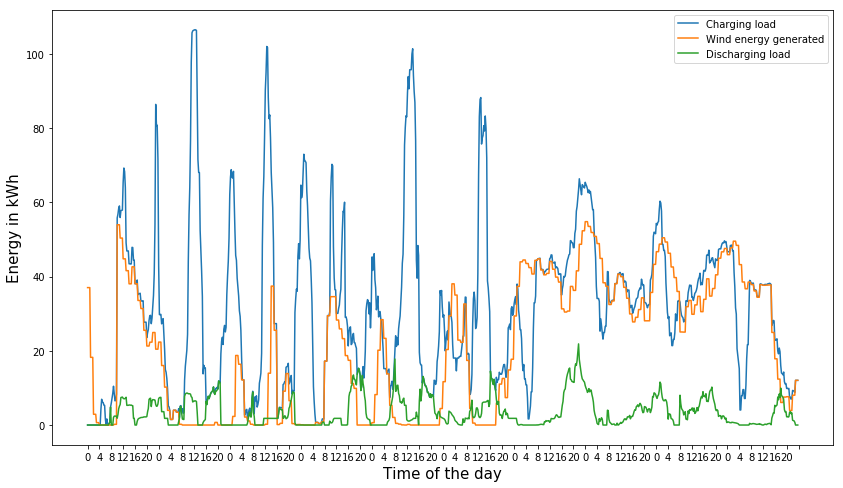

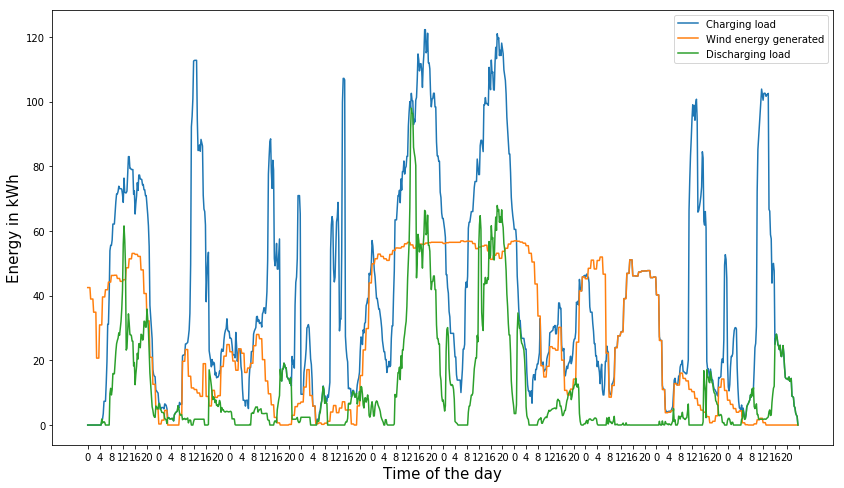

In [4]:
l=1
for delta in [0.0, 0.25, 0.5, 0.75, 1]:
    Simulate_biD_static(S=10,low_Td=4, max_Td=12, eta_v=0.9, delta=delta, delta1=1, delta2=0, delta3=1, NumberOfDays=10, eta_DC_v=0.9,
                        Day_of_Month=15, p=1, Trans_P = 100, timelim =1000)
    l+=1

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14966



Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 10641.4



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 13162.9



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed valu

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 16089



Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 11835.8



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14697.4



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed valu

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 17093.2


C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)





Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 12758.9



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 15881.4



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 51056.6



Scenario 4 NumVar and NumConstr = 225803, 258746
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed va

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 18001.5


C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)





Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 13549.3



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 16827.6



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 51881



Scenario 4 NumVar and NumConstr = 225803, 258746
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed valu

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 227770, 261114
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 18831.4


C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)





Scenario 1 NumVar and NumConstr = 230178, 263866
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14271.4



Scenario 2 NumVar and NumConstr = 230220, 263844
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 17647.5



Scenario 3 NumVar and NumConstr = 225733, 258849
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 52680.4



Scenario 4 NumVar and NumConstr = 225803, 258746
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed va

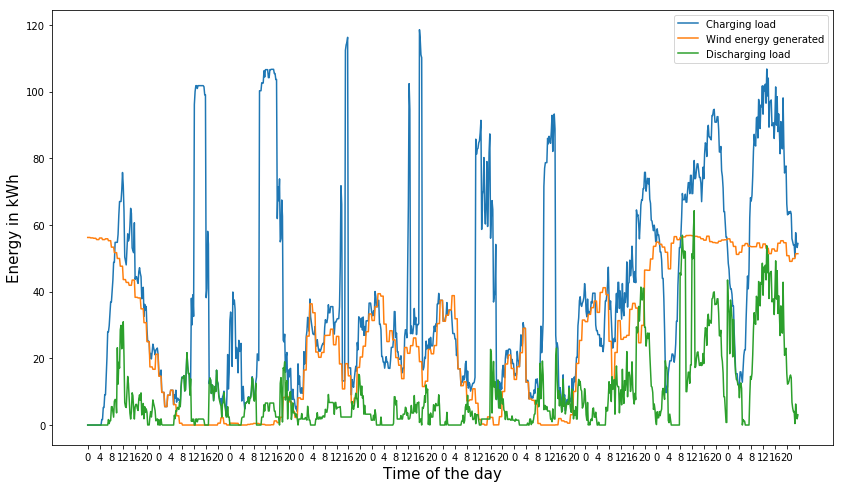

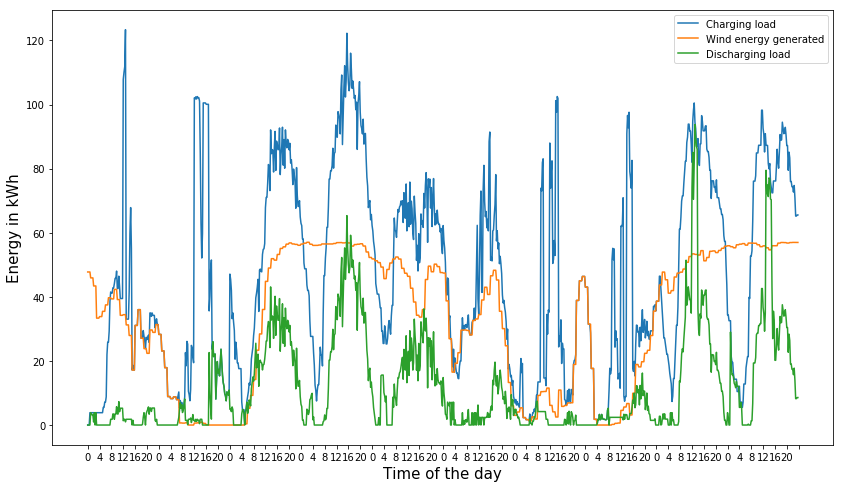

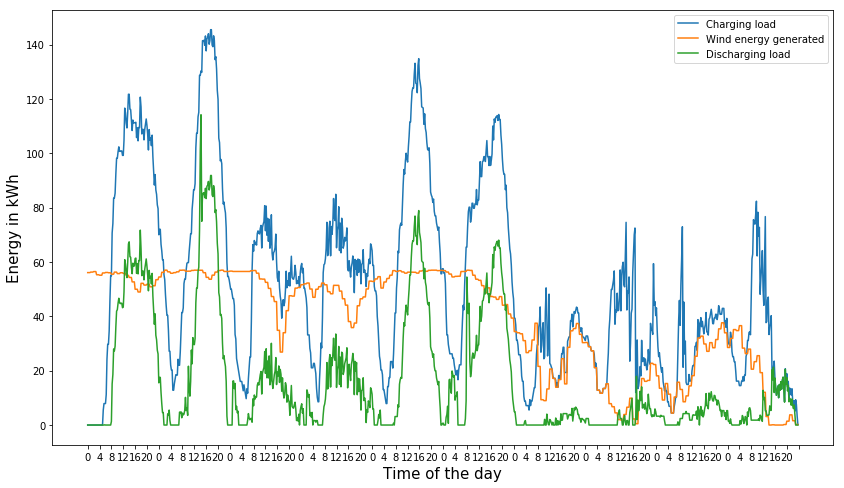

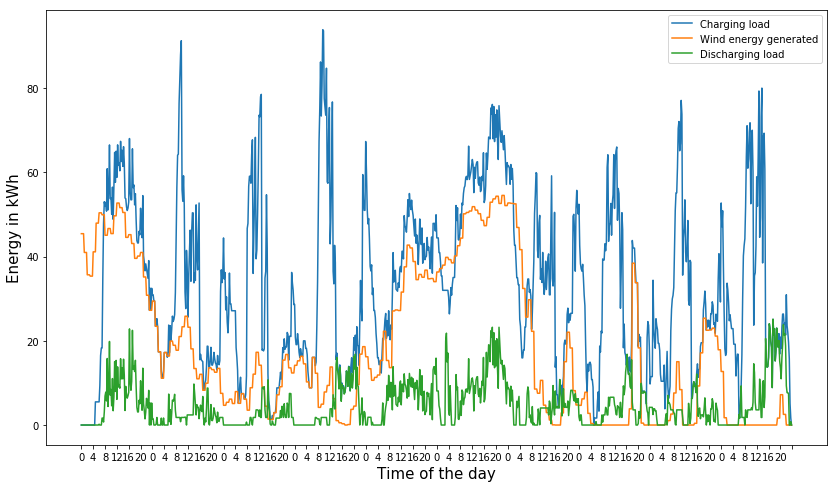

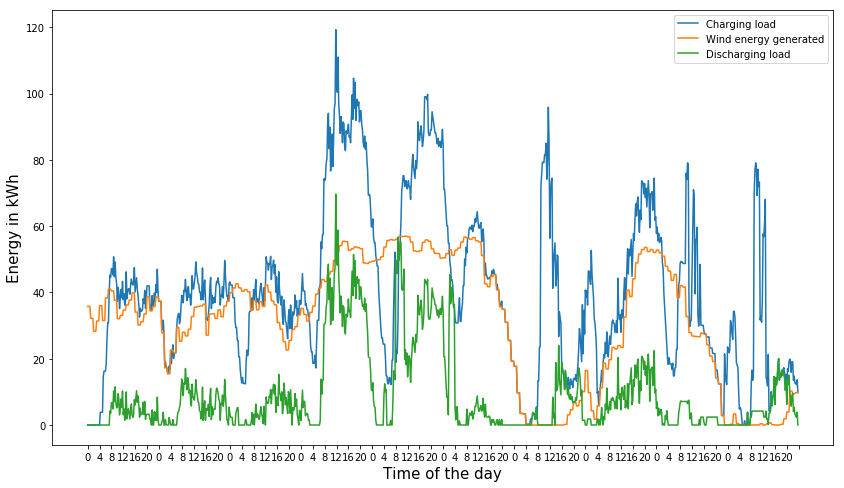

...

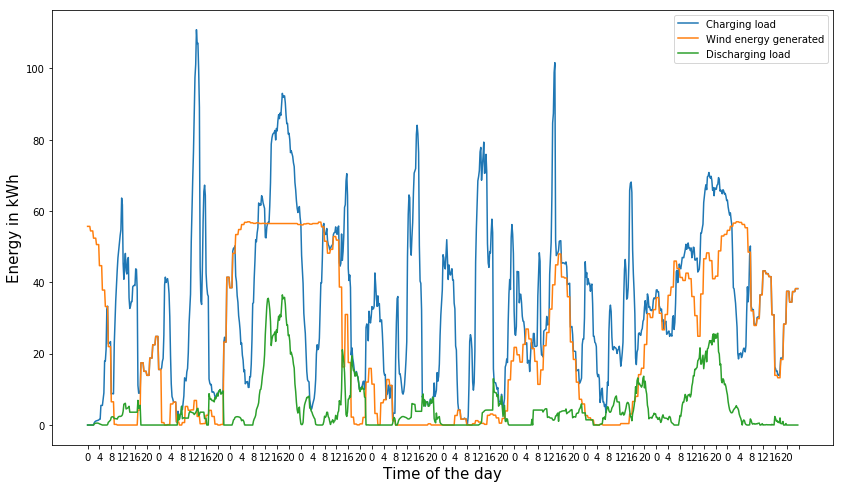

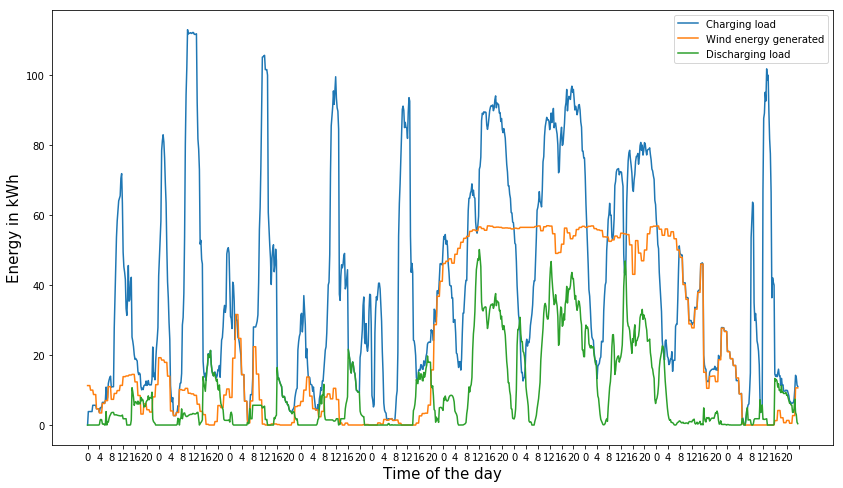

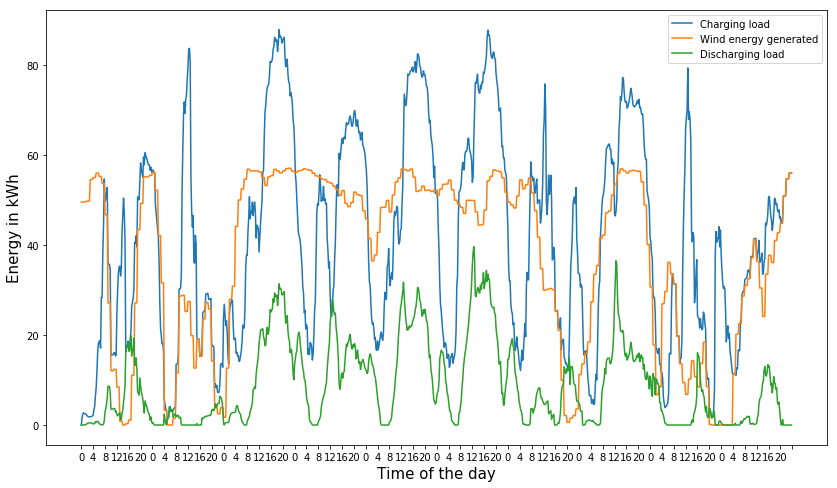

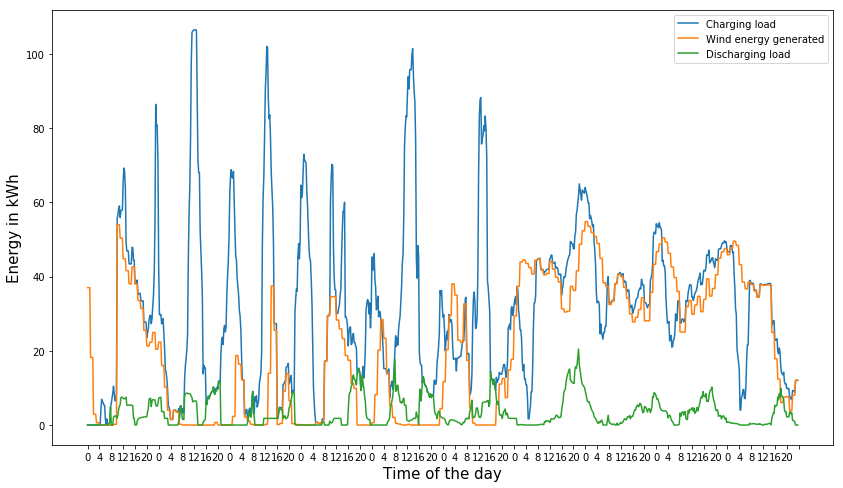

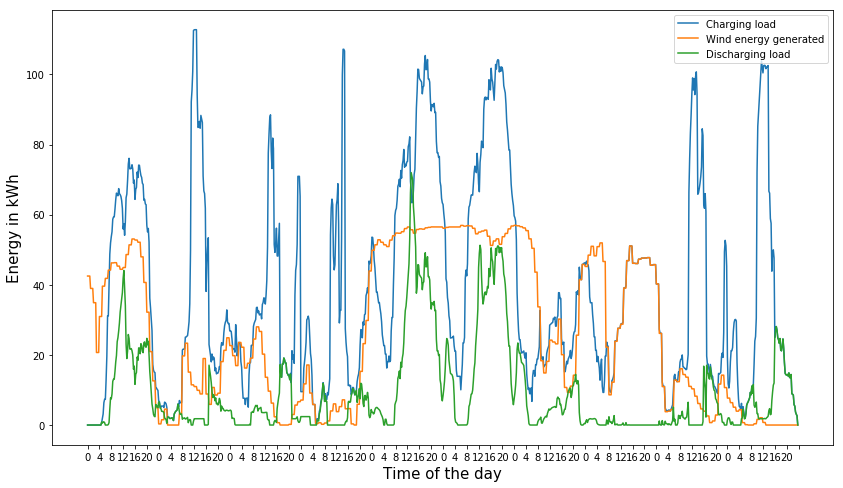

In [5]:
for delta3 in [0.0, 0.25, 0.5, 0.75, 1]:
    Simulate_biD_static(S=10,low_Td=4, max_Td=12, eta_v=0.9, delta=0.25, delta1=1, delta2=0, delta3=delta3, NumberOfDays=10, eta_DC_v=0.9,
                Day_of_Month=15, p=1, Trans_P = 100, timelim =1000)
    l+=1

##### NonOptimal

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 67020, 102463
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 15520.1



Scenario 1 NumVar and NumConstr = 67708, 103479
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 15447



Scenario 2 NumVar and NumConstr = 67720, 103445
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 15318.4



Scenario 3 NumVar and NumConstr = 66438, 101653
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of

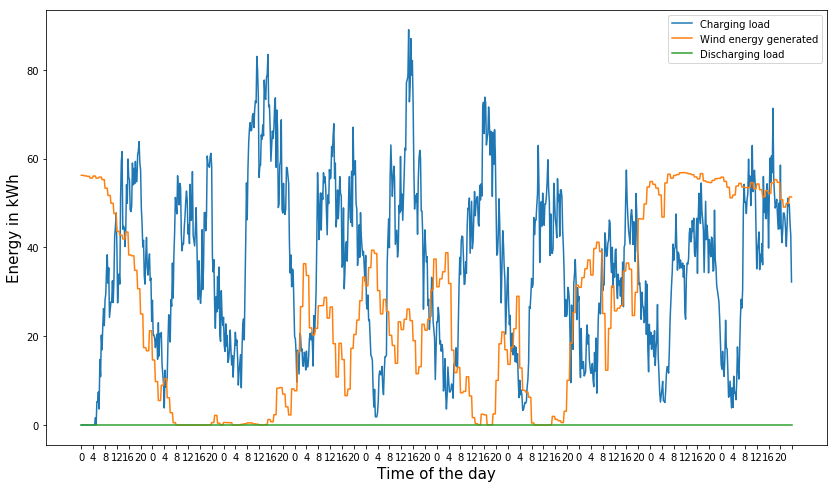

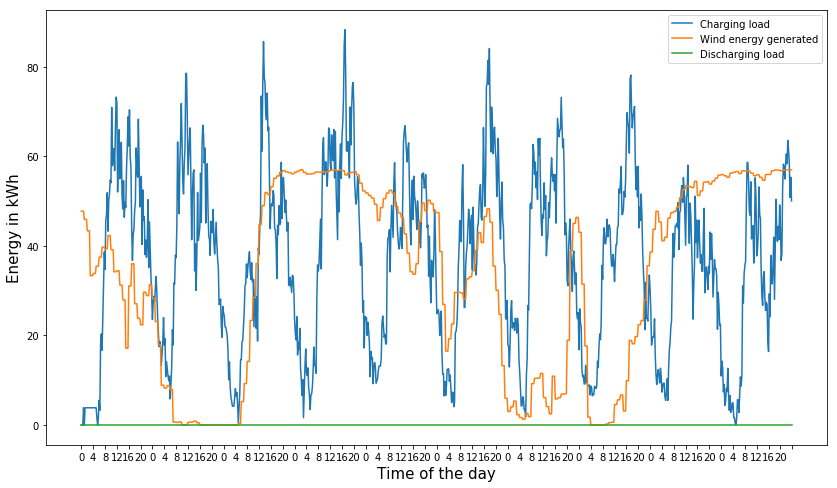

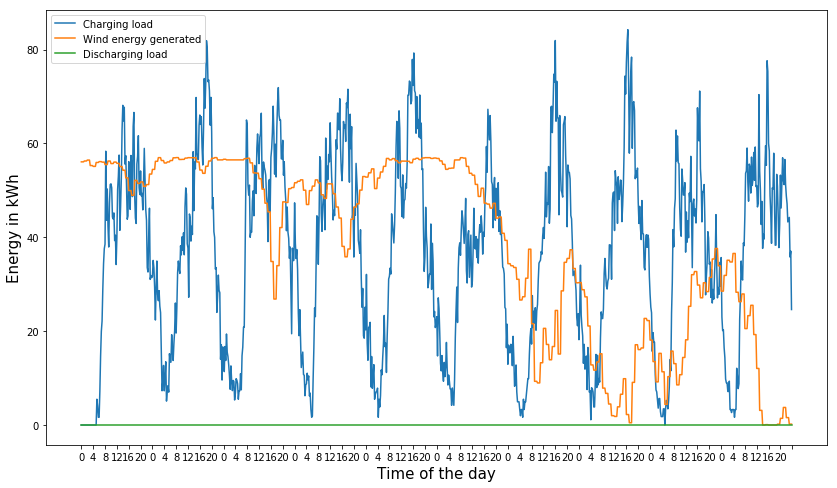

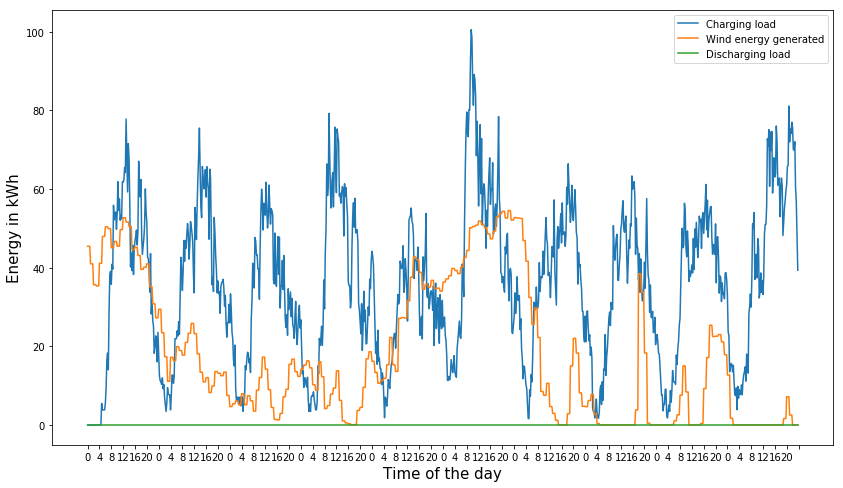

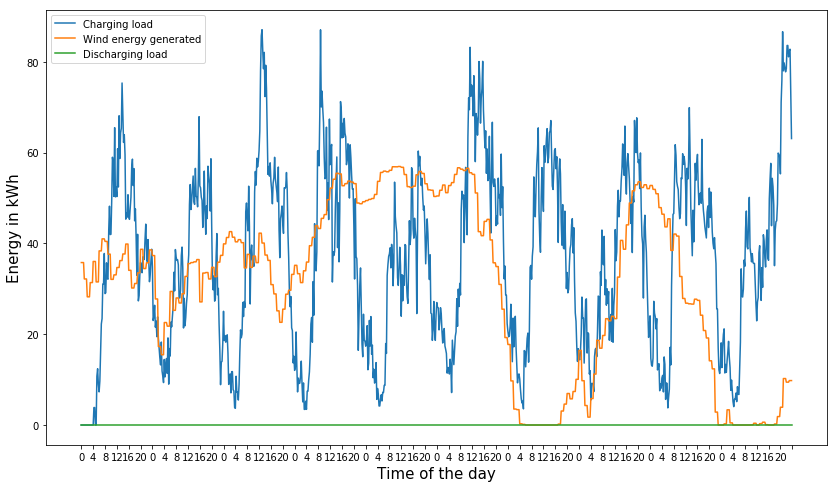

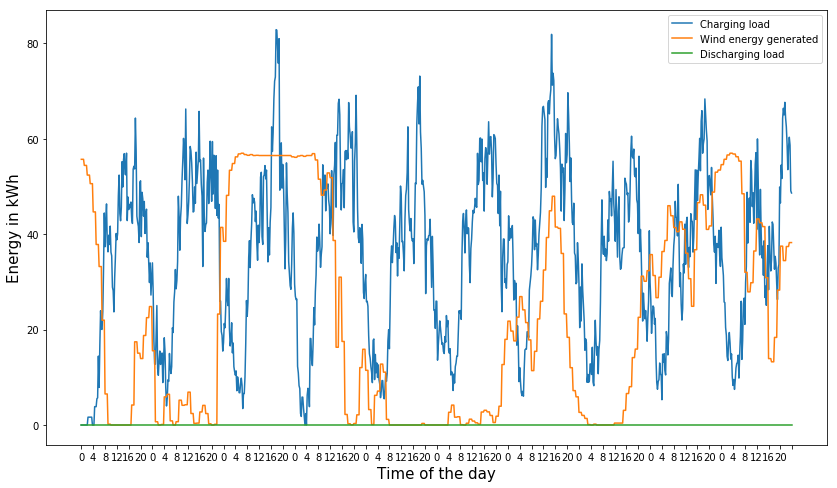

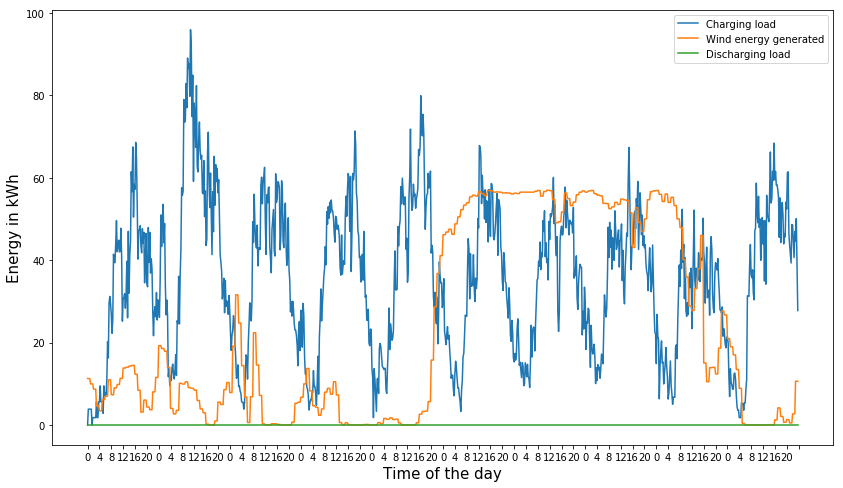

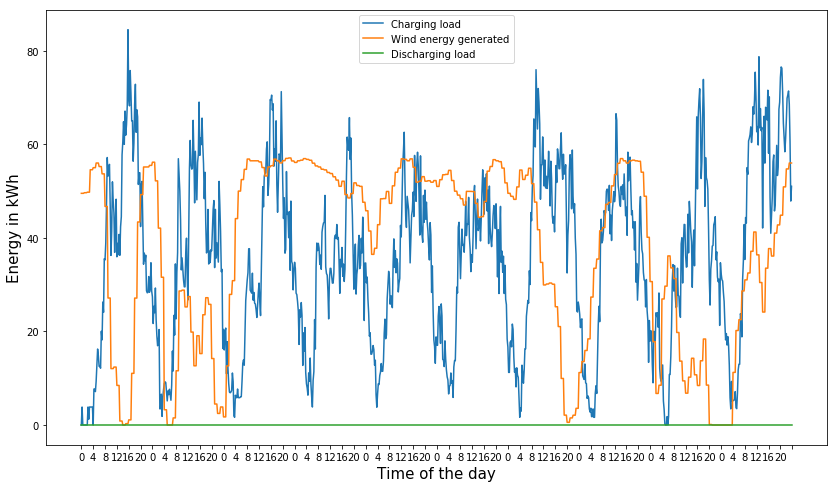

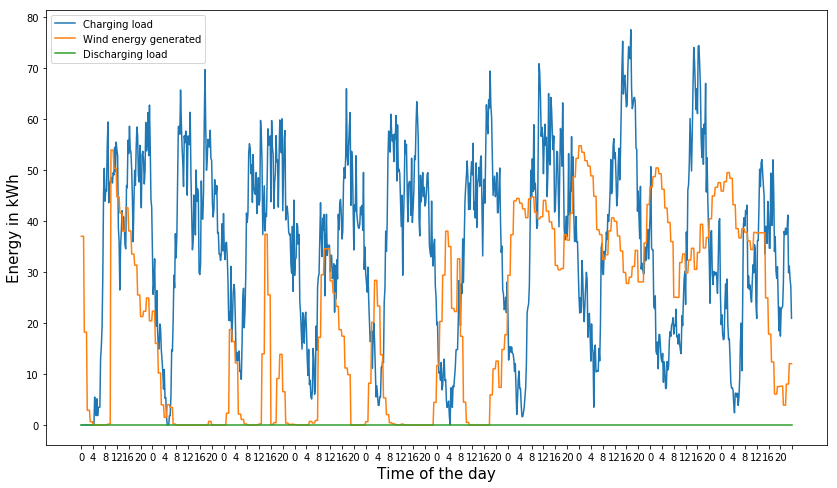

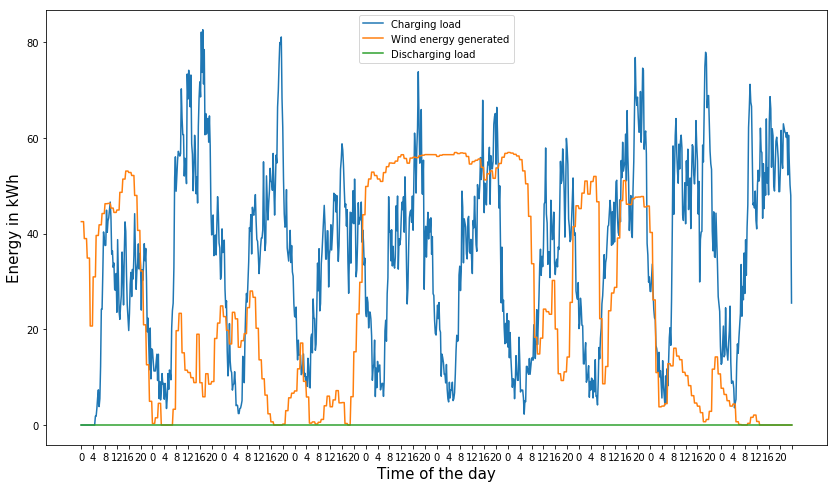

In [6]:
Simulate_biD_static(S=10, low_Td=4, max_Td=12,eta_v=0.9, delta=0.5, delta1=1, delta2=0, delta3=1, NumberOfDays=10, eta_DC_v=0.9,
                        Day_of_Month=15, Trans_P = 100, Optimal=False, p=0, timelim =1000)

#### Performance evaluation for value of flexibility

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


Academic license - for non-commercial use only



Scenario 0 NumVar and NumConstr = 172946, 199872
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 14646.5



Scenario 1 NumVar and NumConstr = 175508, 202573
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 10401.1



Scenario 2 NumVar and NumConstr = 175004, 202035
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 11002



Scenario 3 NumVar and NumConstr = 171049, 197387
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min:

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 200421, 230513
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 15397.5



Scenario 1 NumVar and NumConstr = 202920, 233264
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 11633.2



Scenario 2 NumVar and NumConstr = 202668, 233051
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 11576.9



Scenario 3 NumVar and NumConstr = 198482, 228105
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed va

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]





Scenario 0 NumVar and NumConstr = 254958, 291924
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 15010.5


C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)





Scenario 1 NumVar and NumConstr = 257352, 294596
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 11388.2



Scenario 2 NumVar and NumConstr = 257583, 294932
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 11619.1



Scenario 3 NumVar and NumConstr = 252865, 289624
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed value of parameter TimeLimit to 1000.0
   Prev: 1e+100  Min: 0.0  Max: 1e+100  Default: 1e+100
Optimal objective: 48282.1



Scenario 4 NumVar and NumConstr = 252599, 289008
Changed value of parameter MIPGap to 0.02
   Prev: 0.0001  Min: 0.0  Max: 1e+100  Default: 0.0001
Changed va

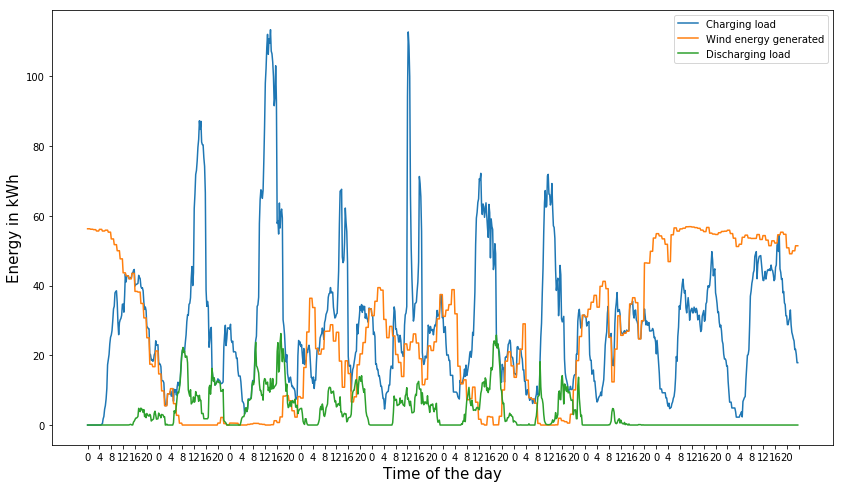

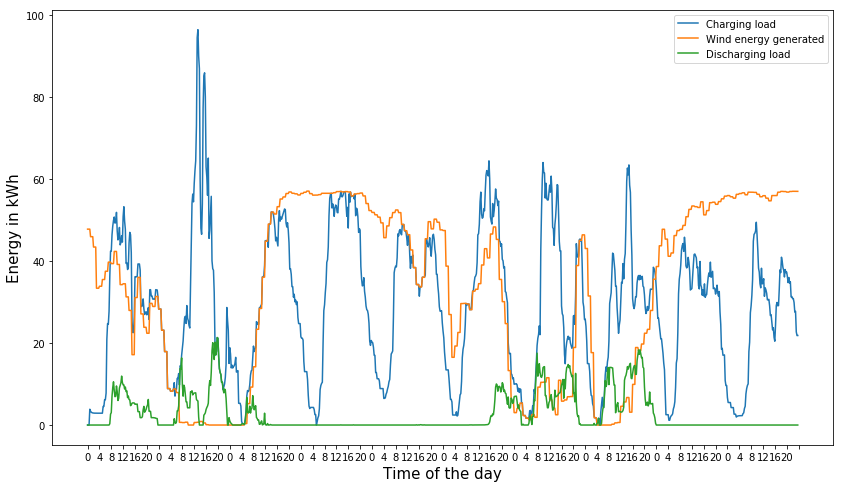

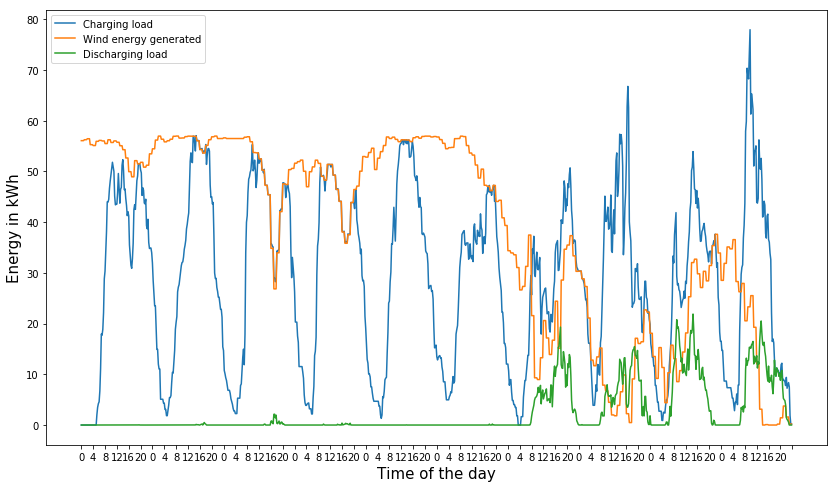

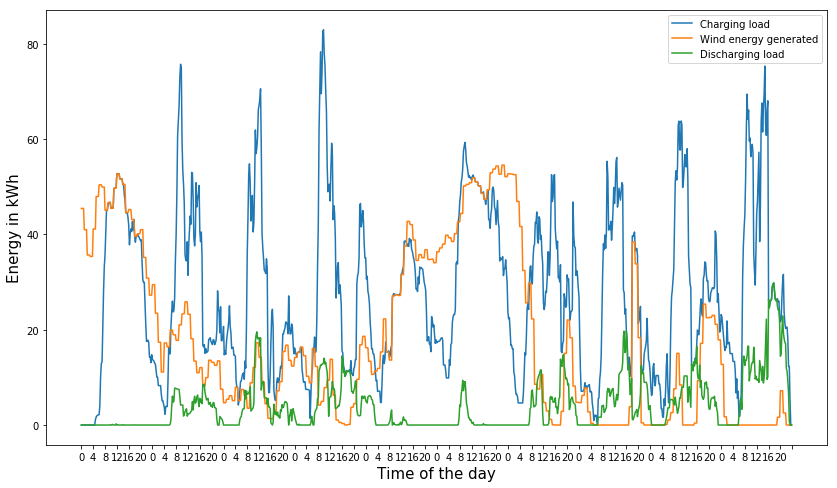

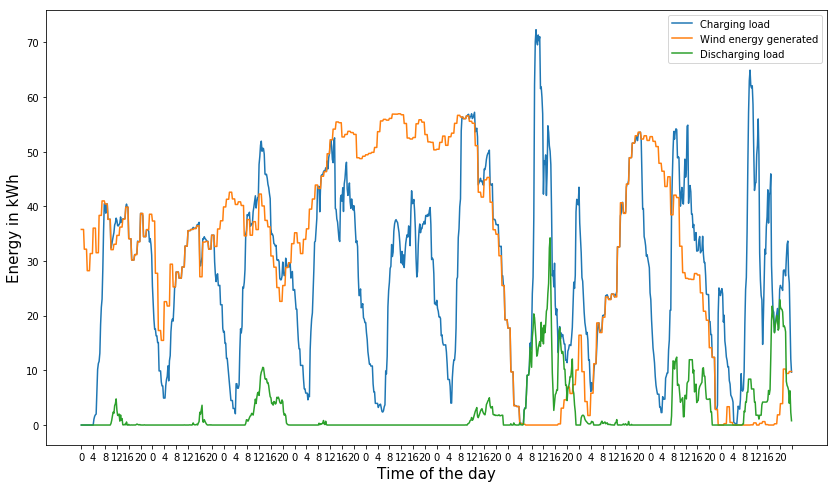

...

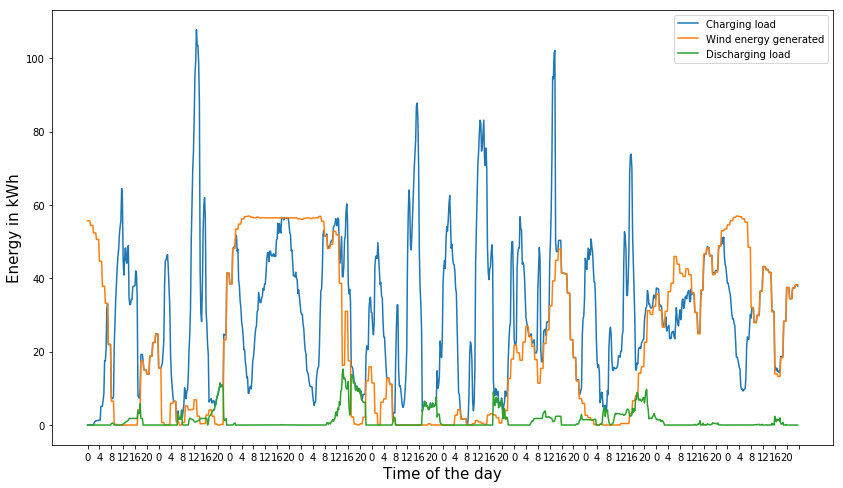

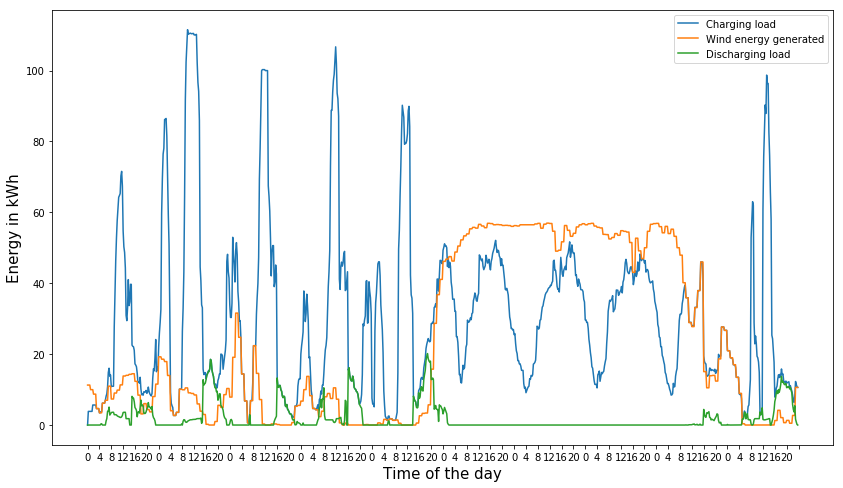

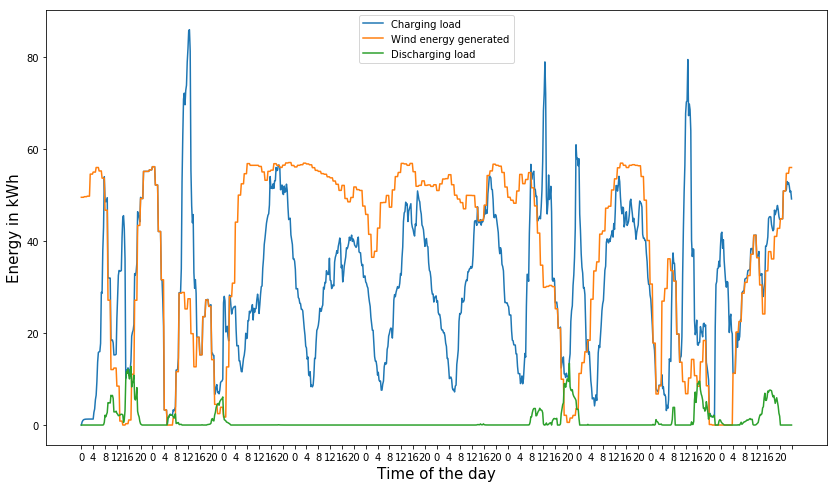

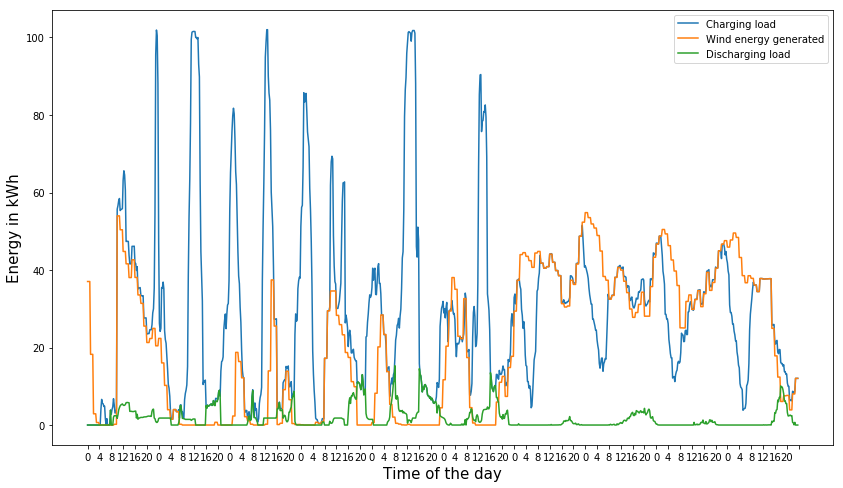

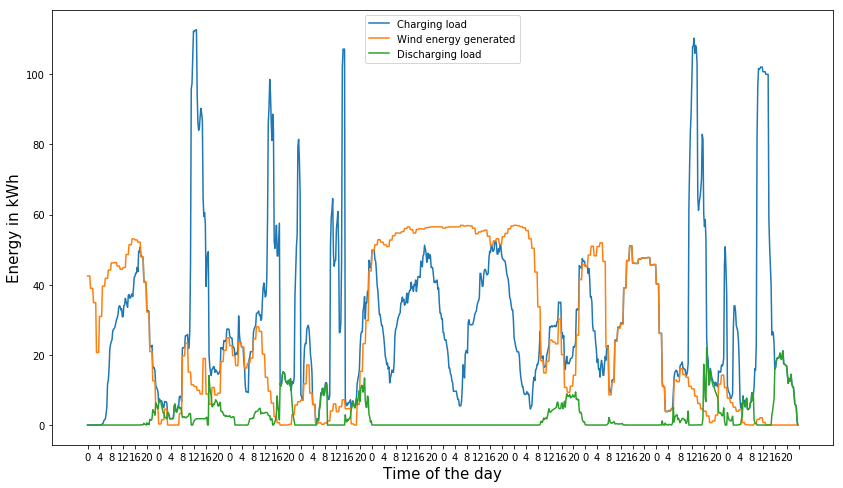

In [6]:
l=10
for low_Td, max_Td in zip([2, 3, 5], [10,11,13]):
    for delta in [0.1]:
        Simulate_biD_static(low_Td=low_Td, max_Td= max_Td, S=10, eta_v=0.9, delta=delta, delta1=1, delta2=0, delta3=1, NumberOfDays=10, eta_DC_v=0.9,
                            Day_of_Month=15, p=1, Trans_P = 100, timelim =1000)
        l+=1